- http://en.wikipedia.org/wiki/Polygonal_modeling
- http://en.wikipedia.org/wiki/Spectrum_analyzer
- https://github.com/catherinedevlin/ipython-sql
- http://ocw.mit.edu/resources/res-6-008-digital-signal-processing-spring-2011/video-lectures/lecture-1-introduction/
- http://www.analog.com/en/design-center/landing-pages/001/beginners-guide-to-dsp.html
- http://en.wikipedia.org/wiki/Digital_signal_processing
- http://en.wikipedia.org/wiki/Digital_signal
- http://en.wikipedia.org/wiki/Signal_(electrical_engineering)
- http://en.wikipedia.org/wiki/Waveform

In [6]:
pwd

u'D:\\dbduy0206\\py-experiment\\src\\iby-notebook'

In [7]:
ls

 Volume in drive D is Data
 Volume Serial Number is E813-0522

 Directory of D:\dbduy0206\py-experiment\src\iby-notebook

06/10/2015  04:01 PM    <DIR>          .
06/10/2015  04:01 PM    <DIR>          ..
06/08/2015  08:57 AM                11 .gitignore
06/10/2015  11:22 AM    <DIR>          .ipynb_checkpoints
06/08/2015  08:57 AM               375 .project
06/08/2015  08:57 AM               457 .pydevproject
06/10/2015  11:21 AM    <DIR>          dbd-op
06/10/2015  02:10 PM    <DIR>          notes
06/10/2015  04:01 PM             2,471 others.ipynb
06/09/2015  05:04 PM    <DIR>          python&linux_system
06/09/2015  02:07 PM               498 run.cmd
06/08/2015  08:57 AM               200 run.sh
06/09/2015  12:25 PM               578 setup.cmd
06/10/2015  02:07 PM    <DIR>          signal_processing
               7 File(s)          4,590 bytes
               7 Dir(s)  74,320,760,832 bytes free


In [ ]:
message = 'The IPython notebook is great!'
# note: the echo command does not run on Windows, it's a unix command.
!echo $message

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


ValueError: third arg must be a format string

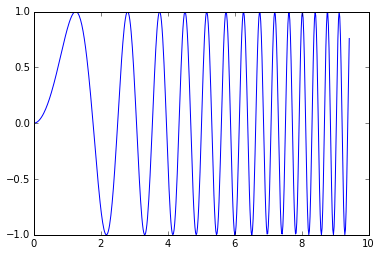

In [5]:
x = linspace(0, 3*pi, 500)
plot(x, sin(x**2))
plot([4, 2],[2,4])
title('A simple chirp');

In [9]:
import time, sys
for i in range(8):
    print i,
    time.sleep(0.5)

0 1 2 3 4 5 6 7


## Clean crash and restart

We call the low-level system libc.time routine with the wrong argument via
ctypes to segfault the Python interpreter:

In [ ]:
import sys
from ctypes import CDLL
# This will crash a Linux or Mac system; equivalent calls can be made on Windows
dll = 'dylib' if sys.platform == 'darwin' else '.so.6'
libc = CDLL("libc.%s" % dll) 
libc.time(-1)  # BOOM!!

## Some ideas


In [6]:
import urllib
from IPython.display import HTML

# HTML(urllib.urlopen('https://zaloapp.com/').read().decode('utf-8'))
HTML('<iframe src="https://zaloapp.com/" width=600 height=400></iframe>')



In [15]:
from IPython.display import Image
Image(url='http://ipython.org/_static/IPy_header.png')

## json

In [14]:
import json
from pprint import pprint
from StringIO import StringIO

with open("D:\\download\\webrtc_internals_dump (2).txt") as json_file:
    json_data = json.load(json_file.read().decode('utf-8'))
    pprint(json_data)


AttributeError: 'unicode' object has no attribute 'read'

In [10]:
import urllib
import json
import pandas as pd

url = 'http://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/significant_week.geojson'
d = json.loads(open("D:\\download\\webrtc_internals_dump (2).txt").read().decode('utf-8'))

data = pd.DataFrame(d.items())
data

,0,1
0,PeerConnections,{u'10048-6': {u'url': u'https://apprtc.appspot...
1,getUserMedia,"[{u'origin': u'https://apprtc.appspot.com', u'..."


In [ ]:
import urllib
import json
import pandas as pd

url = 'http://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/significant_week.geojson'
d = json.loads(urllib.urlopen(url).read())

data = pd.DataFrame(d.items())
data

## Javascript

In [1]:
// http://stackoverflow.com/questions/29202916/how-do-i-find-the-path-of-current-ipython-notebook
%%javascript 
var kernel = IPython.notebook.kernel; 
var proj = window.document.body.getAttribute('data-project'); 
var path = window.document.body.getAttribute('data-notebook-path'); 
var command = "proj = " + "'"+proj+"'";
// kernel.execute(command);
var command = "path = " + "'"+path+"'" kernel.execute(command)


<IPython.core.display.Javascript object>

In [2]:
from IPython.core.display import HTML
src = """
<head>
<meta http-equiv="Content-Type" content="text/html; charset=utf-8">
<title>Simple Test</title>
<script language="javascript" type="text/javascript" src="http://people.iola.dk/olau/flot/jquery.js"></script>
<script src="chrome://resources/js/util.js"></script>
<script src="chrome://webrtc-internals/webrtc_internals.js"></script>
</head>

<body>
Hello World.
</body>
"""
HTML(src)

In [ ]:
from IPython.core.display import HTML
src = '''<html>
        <head>
             <script type="text/javascript" src="http://code.jquery.com/jquery-2.1.1.min.js"></script>
        </head>
        <body onresize="$('#iframe1').attr('height', $(window).height());" style="margin:0;" >
            <iframe id="iframe1" src="%s" style="width:100%%;"  onload="this.height=$(window).height();"></iframe>
        </body>
        </html>
        ''' % 'file:///D:/'
HTML(src)

In [1]:
import urllib
print urllib.urlopen('chrome://webrtc-internals').read()

IOError: [Errno url error] unknown url type: 'chrome'

### client socket

In [2]:
import socket

In [8]:
#create an INET, STREAMing socket
s = socket.socket(
    socket.AF_INET, socket.SOCK_STREAM)
s.connect(("s0.zapps.vn", 5060 ))
s.send(''' INVITE sip:a at qwerty.com SIP/2.0
  Via: SIP/2.0/UDP 169.130.4.4
  FROM: <sip:test at qwerty.com>
  TO: <sip:test2 at qwerty.com>
  call-id: 123456 at Dbk@test.com
  content-length: 0''')
while 1:
    print 'receive data'
    data = s.recv(1024)
    if not data:
        break
    print data

receive data


error: [Errno 10054] An existing connection was forcibly closed by the remote host

In [ ]:
#create an INET, STREAMing socket
s = socket.socket(
    socket.AF_INET, socket.SOCK_STREAM)
s.connect(("s0.zapps.vn", 80 ))
s.send('get / http/1.1\r\n')
data = None
while 1:
    print 'receive data'
    data = s.recv(1024)
    if data == None:
        break
    print data

receive data
HTTP/1.1 400 Bad Request
Date: Thu, 11 Jun 2015 03:27:50 GMT
Server: Apache/2.2.15 (CentOS)
Content-Length: 306
Connection: close
Content-Type: text/html; charset=iso-8859-1

<!DOCTYPE HTML PUBLIC "-//IETF//DTD HTML 2.0//EN">
<html><head>
<title>400 Bad Request</title>
</head><body>
<h1>Bad Request</h1>
<p>Your browser sent a request that this server could not understand.<br />
</p>
<hr>
<address>Apache/2.2.15 (CentOS) Server at ZaloSIP-12.202 Port 80</address>
</body></html>

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

receive data

r

In [ ]:
ip = get_ipython()
ip.system = ip.system_raw

In [ ]:
# https://github.com/rasbt/algorithms_in_ipython_notebooks
# https://rawgit.com/ptwobrussell/Mining-the-Social-Web-2nd-Edition/master/ipynb/html/Chapter%209%20-%20Twitter%20Cookbook.html
# http://docs.getpelican.com/en/3.5.0/
# http://cs.stanford.edu/people/karpathy/hn_analysis.html
# http://pandas.pydata.org/index.html